In [1]:
import gym
import torch
import gym_nav
import numpy as np

import sys
sys.path.append('../')
from evaluation import *
from model_evaluation import *
from trajectories import *
from shortcut_analysis import *
from explore_analysis import *

from tqdm import tqdm
from umap import UMAP
from sklearn.cluster import KMeans
from sklearn.metrics import pairwise_distances

In [165]:
'''3M timesteps of training'''
all_shortcut_res = pickle.load(open('data/shortcut/shortcut_umap_activations', 'rb'))
all_cluster_res = pickle.load(open('data/shortcut/shortcut_cluster_res', 'rb'))
all_chks = {
    32: np.array([80, 120, 160, 200, 240, 280, 320, 360, 400, 440, 480, 520, 560, 600, 640, 680, 720, 760, 800, 840, 880, 920]),
    64: np.array([40, 60, 80, 100, 120, 140, 160, 180, 200, 220, 240, 260, 280, 300, 320, 340, 360, 380, 400, 420, 440, 460]),
}
batch_sizes = [32, 64]
probs = [0.1, 0.2, 0.4]


In [155]:
'''Longer training - p=0.1, 0.4 only'''
all_shortcut_res = pickle.load(open('data/shortcut/shortcut_umap_activations_longer', 'rb'))
all_cluster_res = pickle.load(open('data/shortcut/shortcut_cluster_res_longer', 'rb'))
all_chks = {
    32: np.arange(80, 4680, 80),
    64: np.arange(40, 2340, 40),
}
batch_sizes = [32, 64]
probs = [0.1, 0.4]

In [303]:
n_clusters = 5
cluster_labels = ['Start', 'Entrance', 'Shortcut', 'Corridor Entrance', 'Near Platform']

def get_ep_lens(ep_pos):
    ep_lens = [len(ep) for ep in ep_pos]
    return ep_lens

def ep_split_res(target, ep_lens):
    data = []
    cur_idx = 0
    for l in ep_lens:
        data.append(target[cur_idx:cur_idx+l])
        cur_idx += l
    return data


def kmeans_activ_pos_plot(pos, activ2d, labels=None, ax=None, n_clusters=5, km=None):
    '''
    Plot kmeans activ2d plot with positions
    Can give a combination of
    activ2d: perform kmeans on this
    activ2d/km: perform kmeans using an already fit km object
    labels: use existing labels
    '''
    format_ax = False
    if ax is None:
        format_ax = True
        fig, ax = pplt.subplots(ncols=n_clusters+1, sharey=False, sharex=False)
        
    if labels is None:
        if km is None:
            km = KMeans(n_clusters=n_clusters)
            labels = km.fit_predict(activ2d)
        else:
            labels = km.predict(activ2d)

    cluster_range = km.n_clusters if km is not None else n_clusters
    for i in range(cluster_range):
        idxs = labels == i
        ax[0].scatter(activ2d[idxs].T[0], activ2d[idxs].T[1], color=rgb_colors[i], alpha=0.1)
        ax[i+1].scatter(pos[idxs].T[0], pos[idxs].T[1], color=rgb_colors[i], alpha=0.1)
        
    if format_ax:
        ax[1:].format(xlim=[0, 300], ylim=[0, 300])
        
        
        
def shortcut_km_cluster_prob2(ep_labels, pos):
    cluster_names = ['start', 'entry', 'shortcut', 'corridor', 'platform']
    cluster_idxs = [] #which label is each cluster most likely to be
    cluster_probs = []
    n_clusters=5
    labels = np.concatenate(ep_labels)

    no_remap_conflict = True
    first_labels = np.array([l[0] for l in ep_labels])
    for i in range(n_clusters):
        # are positions mostly above or below corridor?
        p = pos[labels == i]
        above_corridor = (p[:, 1] > 250).sum() / len(p)
        left = (p[:, 0] < 175).sum() / len(p)

        p2 = p[(p[:, 1] > 240) & (p[:, 1] < 260)]
        if len(p2) > 4:
            left2 = (p2[:, 0] < 125).sum() / len(p2)
            right2 = 1 - left2
        else:
            left2 = 0.
            right2 = 0.
        start = (first_labels == i).sum() / len(first_labels)

        prios = []
        if left > 0.5: #mostly left corridor
            above_prios = [3, 4]
        else:
            above_prios = [4, 3]

        if left2 > 0.5: #mostly left entrance
            below_prios = [1, 2]
        else:
            below_prios = [2, 1]

        if start > 0.5:
            prios += [0]
            if above_corridor > 0.5:
                prios += above_prios
                prios += below_prios
            else:
                prios += below_prios
                prios += above_prios
        else:
            if above_corridor > 0.5:
                prios += above_prios
                prios += below_prios
            else:
                prios += below_prios
                prios += above_prios
            prios += [0]

        for j, prio in enumerate(prios):
            if prio not in cluster_idxs:
                cluster_idxs.append(prio)
                break
            no_remap_conflict = False
                
        probs = [start, (1-above_corridor)*left2, (1-above_corridor)*right2,
                              above_corridor*left, above_corridor*(1-left)]
        cluster_probs.append(probs)
    
    # Note this is indexed as cluster_probs[cluster_idx][cluster_label likelihood]
    cluster_probs = np.vstack(cluster_probs)
    
    relabel_map = {i: cluster_idxs[i] for i in range(n_clusters)}
    
    reorder_idxs = np.argsort(list(relabel_map.values()))
    keys = list(relabel_map.keys())
    values = list(relabel_map.values())
    relabel_map2 = {}
    for idx in reorder_idxs:
        relabel_map2[values[idx]] = keys[idx]
    reordered_cluster_probs = cluster_probs[list(relabel_map2.values()), :]
    
    # Calculate transition probabilities while we are here
    reordered_ep_labels = [relabel_cluster(e, relabel_map) for e in ep_labels]
    transition_probs = shortcut_km_transition_probs(reordered_ep_labels)

    return {
        'cluster_probs': cluster_probs, 
        'relabel_map': relabel_map, 
        'cluster_names': cluster_names, 
        'no_remap_conflict': no_remap_conflict,
        'reordered_cluster_probs': reordered_cluster_probs,
        'reordered_transition_probs': transition_probs
    }

    
def shortcut_km_cluster_prob(ep_labels, pos):
    '''
    Given episodic labels for clusters and positions, compute probability that
    clusters are of a certain type assuming that the position of the agent is closely
    related to the cluster its activation belongs to
    
    Afterwards, perform relabeling of the passed ep_label data and return 
        probabilities that each cluster was the cluster it seemed and transition
        probabilities between clusters
    '''
    cluster_names = ['start', 'entry', 'shortcut', 'corridor', 'platform']
    
    n_clusters=5
    labels = np.concatenate(ep_labels)
    
    # Clusters including starting points
    start_cluster = np.zeros(n_clusters)
    for i in range(len(ep_labels)):
        start_cluster[ep_labels[i][0]] += 1

    # Clusters that tend to cross the corridor entrance
    entry_cluster = np.zeros(n_clusters)
    l = labels[(pos[:, 0] >= 0) & (pos[:, 0] <= 50) & (pos[:, 1] >= 235) & (pos[:, 1] <= 265)]
    for i in range(n_clusters):
        entry_cluster[i] = (l == i).sum()
                     
    # Clusters that tend to cross the shortcut
    shortcut_cluster = np.zeros(n_clusters)
    l = labels[(pos[:, 0] >= 125) & (pos[:, 0] <= 175) & (pos[:, 1] >= 235) & (pos[:, 1] <= 265)]
    for i in range(n_clusters):
        shortcut_cluster[i] = (l == i).sum()

    # Clusters that tend to be in the main corridor entrance area
    corridor_cluster = np.zeros(n_clusters)
    l = labels[(pos[:, 0] >= 0) & (pos[:, 0] <= 150) & (pos[:, 1] >= 250)]
    for i in range(n_clusters):
        corridor_cluster[i] = (l == i).sum()

    # Clusters that tend to be in the corridor area close to the platform
    platform_cluster = np.zeros(n_clusters)
    l = labels[(pos[:, 0] >= 150) & (pos[:, 1] >= 250)]
    for i in range(n_clusters):
        platform_cluster[i] = (l == i).sum()

    cluster_probs = [start_cluster, entry_cluster, shortcut_cluster, corridor_cluster, platform_cluster]        
    cluster_probs2 = []
    for c in cluster_probs:
        if c.sum() == 0 or np.isnan(c.sum()):
            probs = np.zeros(n_clusters)
        else:
            probs = c / c.sum()
        cluster_probs2.append(probs)
    cluster_probs = np.vstack(cluster_probs2)
    
    relabel_map = {}
    used_targets = []
    for i in range(n_clusters):
        targets = np.flip(np.argsort(cluster_probs.T[i]))
        found = False
        n = 0
        while not found:
            target = targets[n]
            n += 1
            if target not in used_targets:
                found = True
        used_targets.append(target)
        relabel_map[i] = target
        
    if len(np.unique(cluster_probs.argmax(axis=0))) == n_clusters and \
        len(np.unique(cluster_probs.argmax(axis=1))) == n_clusters:
        no_remap_conflict = True
    else:
        no_remap_conflict = False
            
            
    # Cluster probability matrix using the relabeled clusters - should have close to
    #  diagonal highest probability
    reorder_idxs = np.argsort(list(relabel_map.values()))
    keys = list(relabel_map.keys())
    values = list(relabel_map.values())
    relabel_map2 = {}
    for idx in reorder_idxs:
        relabel_map2[values[idx]] = keys[idx]
    reordered_cluster_probs = cluster_probs[:, list(relabel_map2.values())]
    
    # Calculate transition probabilities while we are here
    reodered_ep_labels = [relabel_cluster(e, relabel_map) for e in ep_labels]
    transition_probs = shortcut_km_transition_probs(ep_labels2)
    
    return {
        'cluster_probs': cluster_probs, 
        'relabel_map': relabel_map, 
        'cluster_names': cluster_names, 
        'no_remap_conflict': no_remap_conflict,
        'reordered_cluster_probs': reordered_cluster_probs,
        'reordered_transition_probs': transition_probs
    }


def relabel_cluster(labels, relabel_map):
    '''
    Relabel a batch of labels to fit the relabelled schema
    '''
    relabelled = labels.copy()
    for i in range(len(labels)):
        relabelled[i] = relabel_map[labels[i]]
    return relabelled


def shortcut_km_transition_probs(ep_labels, n_clusters=5, as_probs=True):
    '''
    Given episodic labels, track how likely transitions are from one cluster to the next
    
    as_probs: compute transition probabilities instead of counts
    '''
    transitions = np.zeros((n_clusters, n_clusters))
    for l in ep_labels:
        for i in range(len(l)-1):
            start = l[i]
            end = l[i+1]
            transitions[start][end] += 1
            
    if as_probs:
        for i in range(n_clusters):
            transitions[i] = transitions[i] / transitions[i].sum()
            
    return transitions



def shortcut_cluster_analysis(s, normalize=True):
    '''Pass a shortcut_res object to perform clustering analysis'''
    n_clusters = 5
    activ2d = s['activ2d'].copy()
    if normalize:
        xmin, ymin = activ2d.min(axis=0)
        xmax, ymax = activ2d.max(axis=0)
        activ2d[:, 0] = (activ2d[:, 0] - xmin) / (xmax - xmin)
        activ2d[:, 1] = (activ2d[:, 1] - ymin) / (ymax - ymin)
    
    pos = s['pos']
    ep_lens = get_ep_lens(s['ep_pos'])
    km = KMeans(n_clusters=n_clusters)
    labels = km.fit_predict(activ2d)
    ep_labels = ep_split_res(labels, ep_lens)

    res = shortcut_km_cluster_prob2(ep_labels, pos)
    relabel_map = res['relabel_map']
    
    labels = relabel_cluster(labels, relabel_map)
    
    relabelled_centers = np.zeros(km.cluster_centers_.shape)
    for i in range(n_clusters):
        relabelled_centers[relabel_map[i]] = km.cluster_centers_[i]
        
    res['labels'] = labels
    res['cluster_centers'] = relabelled_centers
    
    t = res['reordered_transition_probs'].copy()
    for i in range(len(t)):
        t[i, i] = 0
        if t[i].sum() != 0:
            t[i] = t[i] / t[i].sum()
        else:
            t[i] = 0.
    res['t_prob'] = t
    res['km'] = km
    
    res['ep_activ2d'] = ep_split_res(activ2d, ep_lens)
    res['activ2d'] = activ2d
    return res


def linear_bestfit(x, y):
    if type(x) == list:
        x = np.array(x)
    if type(y) == list:
        y = np.array(y)
    
    if len(x.shape) == 1:
        x = x.reshape(-1, 1)
    
    lr = LinearRegression().fit(x, y)
    y_pred = lr.predict(x)
    
    x_min, x_max = x.min(), x.max()
    r2 = r2_score(y, y_pred)
    
    xs = np.array([x_min, x_max]).reshape(-1, 1)
    ys = lr.predict(xs)
    
    return xs, ys, r2

# Record cluster analysis

**3M Training steps**

In [203]:
all_cluster_res = {}

for batch, prob, trial in tqdm(itertools.product(batch_sizes, probs, range(3)), total=2*3*3):
    key = f'{batch}_{prob}_{trial}'
    shortcut_res = all_shortcut_res[key]
    
    cluster_res = defaultdict(list)
    cluster_res['cluster_probs'] = np.zeros((n_clusters, len(shortcut_res)))
    for j, s in enumerate(shortcut_res):
        res = shortcut_cluster_analysis(s)
        
        cluster_res['labels'].append(res['labels'])        
        for i in range(5):
            cluster_res['cluster_probs'][i, j] = res['reordered_cluster_probs'][i, i]            
        cluster_res['cluster_centers'].append(res['cluster_centers'])
        cluster_res['t_prob'].append(res['t_prob'])
        
    all_cluster_res[key] = cluster_res
        
pickle.dump(all_cluster_res, open('data/shortcut/shortcut_cluster_res', 'wb'))

100%|██████████████████████████████████████████████████████████████████████████████████| 18/18 [01:23<00:00,  4.66s/it]


**Longer 15M Training steps**

In [538]:
all_cluster_res = {}

for batch, prob, trial in tqdm(itertools.product(batch_sizes, probs, range(3)), total=2*2*3):
    key = f'{batch}_{prob}_{trial}'
    shortcut_res = all_shortcut_res[key]
    
    cluster_res = defaultdict(list)
    cluster_res['cluster_probs'] = np.zeros((n_clusters, len(shortcut_res)))
    for j, s in enumerate(shortcut_res):
        pos = s['pos']
        ep_lens = get_ep_lens(s['ep_pos'])
        km = KMeans(n_clusters=n_clusters)
        labels = km.fit_predict(s['activ2d'])
        ep_labels = ep_split_res(labels, ep_lens)

        res = shortcut_km_cluster_prob2(ep_labels, pos)
        relabel_map = res['relabel_map']
        cluster_res['labels'].append(relabel_cluster(labels, relabel_map))
        
        for i in range(5):
            cluster_res['cluster_probs'][i, j] = res['reordered_cluster_probs'][i, i]
            
        relabelled_centers = np.zeros(km.cluster_centers_.shape)
        for i in range(n_clusters):
            relabelled_centers[relabel_map[i]] = km.cluster_centers_[i]
            
        cluster_res['cluster_centers'].append(relabelled_centers)
    all_cluster_res[key] = cluster_res
        
pickle.dump(all_cluster_res, open('data/shortcut/shortcut_cluster_res_longer', 'wb'))

100%|██████████████████████████████████████████████████████████████████████████████████| 12/12 [01:16<00:00,  6.36s/it]


# Experimenting transition probs

In [64]:
ep_activ2d = ep_split_res(s['activ2d'], ep_lens)
km = KMeans(n_clusters=5)
labels = km.fit_predict(s['activ2d'])
ep_labels = ep_split_res(labels, ep_lens)

In [69]:
l = ep_labels[0]

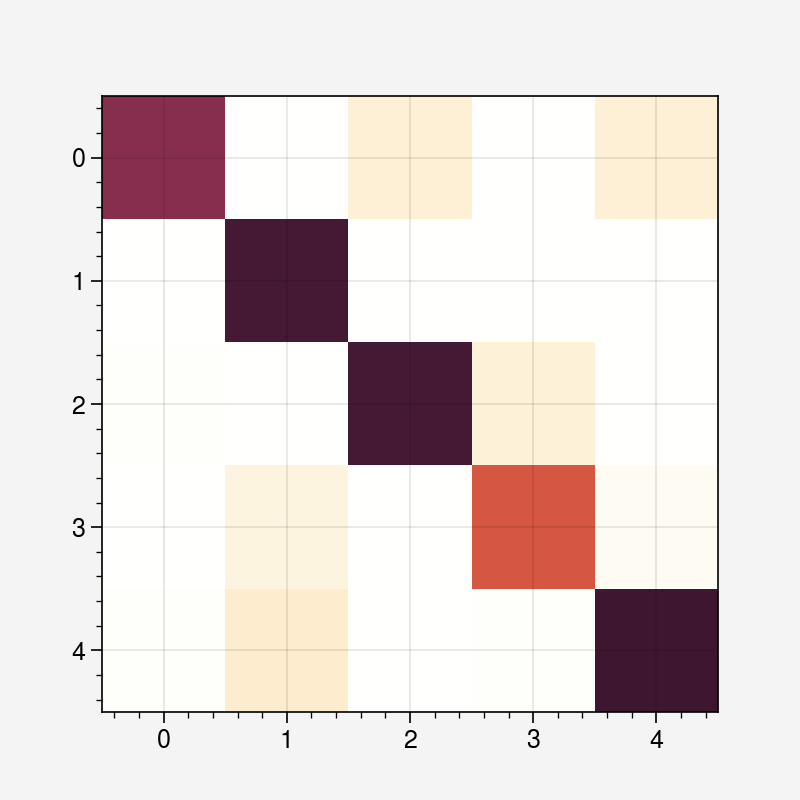

In [100]:

plt.imshow(transitions)

In [229]:
t_prob

array([[0.        , 0.00613497, 0.36809816, 0.34969325, 0.27607362],
       [0.        , 0.        , 0.6424581 , 0.3575419 , 0.        ],
       [0.01657459, 0.98342541, 0.        , 0.        , 0.        ],
       [0.51587302, 0.        , 0.        , 0.        , 0.48412698],
       [0.33333333, 0.        , 0.        , 0.66666667, 0.        ]])

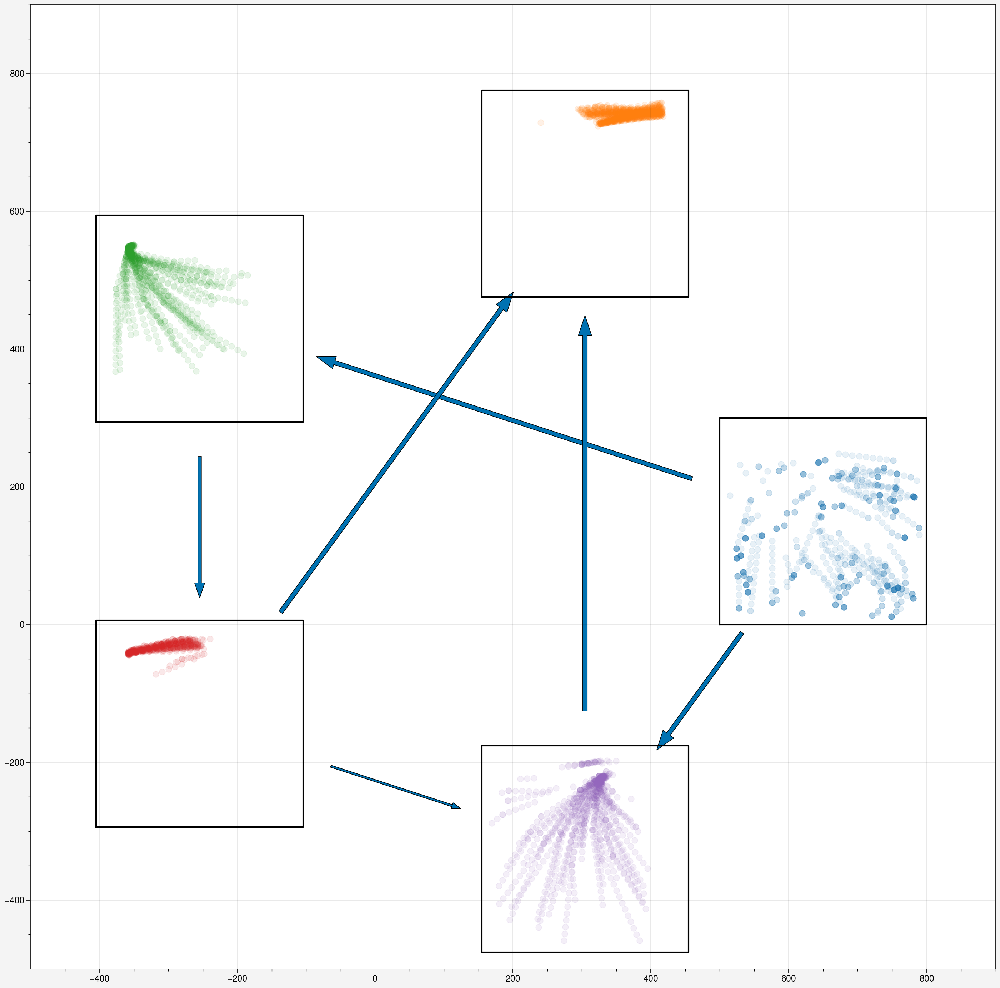

In [153]:
fig, ax = pplt.subplots(figwidth=14)

n_clusters = 5
angle_offsets = np.linspace(0, 2*np.pi, n_clusters, endpoint=False)
position_offsets = [np.cos(angle_offsets)*500, np.sin(angle_offsets)*500]

t = transitions.copy()
for i in range(len(t)):
    # t[i, i] = 0
    t[i] = t[i]/t[i].sum()


box = np.array([
    [0, 0],
    [0, 300],
    [300, 300],
    [300, 0],
    [0, 0]
], dtype='float')
box_centers = np.array(position_offsets).T+150

for i in range(n_clusters):
    for j in range(n_clusters):
        if i == j or t[i, j] < 0.01:
            continue
        center1 = box_centers[i]
        center2 = box_centers[j]
        x, y = center1[0], center1[1]
        dx, dy = center2[0]-center1[0], center2[1]-center1[1]
        arrow_angle = np.arctan2(dy, dx)
        x += np.cos(arrow_angle)*200
        y += np.sin(arrow_angle)*200
        dx -= np.cos(arrow_angle)*(400+t[i,j]*90)
        dy -= np.sin(arrow_angle)*(400+t[i,j]*90)
        ax.arrow(x, y, dx, dy, width=t[i, j]*100)

pos = s['pos']
for i in range(n_clusters):
    p = pos[labels == i]
    b = box.copy()
    p[:, 0] += position_offsets[0][i]
    p[:, 1] += position_offsets[1][i]
    b[:, 0] += position_offsets[0][i]
    b[:, 1] += position_offsets[1][i]
    ax.scatter(p.T[0], p.T[1], color=rgb_colors[i], alpha=0.1)
    ax.plot(b.T[0], b.T[1], color='black')

# ax.scatter(position_offsets[0], position_offsets[1])
ax.format(xlim=[-500, 900], ylim=[-500, 900])

In [370]:
pos = s['pos']
ep_lens = get_ep_lens(s['ep_pos'])
km = KMeans(n_clusters=n_clusters)
labels = km.fit_predict(s['activ2d'])
ep_labels = ep_split_res(labels, ep_lens)

cluster_res = shortcut_km_cluster_prob(ep_labels, pos)

labels2 = relabel_cluster(labels, relabel_map)
ep_labels2 = ep_split_res(labels2, ep_lens)
transition_probs = shortcut_km_transition_probs(ep_labels2)

In [336]:
pos = s['pos']
ep_lens = get_ep_lens(s['ep_pos'])
km = KMeans(n_clusters=n_clusters)
labels = km.fit_predict(s['activ2d'])
ep_labels = ep_split_res(labels, ep_lens)

cluster_res = shortcut_km_cluster_prob(ep_labels, pos)

# Cluster labelling confidence

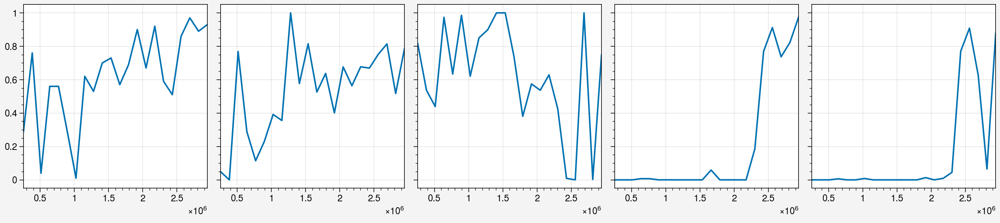

In [522]:

shortcut_res = all_shortcut_res[key]
cluster_probs = np.zeros((5, len(shortcut_res)))

for j, s in enumerate(shortcut_res):
    pos = s['pos']
    ep_lens = get_ep_lens(s['ep_pos'])
    km = KMeans(n_clusters=n_clusters)
    labels = km.fit_predict(s['activ2d'])
    ep_labels = ep_split_res(labels, ep_lens)

    cluster_res = shortcut_km_cluster_prob2(ep_labels, pos)
    
    for i in range(5):
        cluster_probs[i, j] = cluster_res['reordered_cluster_probs'][i, i]

fig, ax = pplt.subplots(ncols=5)
for i in range(5):
    ax[i].plot(np.array(chks)*64*100, cluster_probs[i])

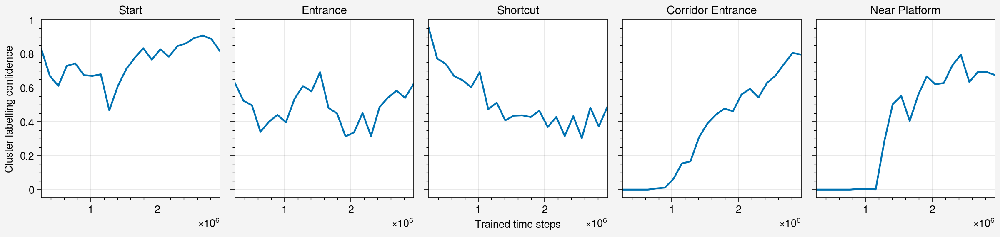

In [127]:
batch = 64
p = 0.4
trial = 0
key = f'{batch}_{p}_{trial}'

chks = all_chks[batch]
shortcut_res = all_shortcut_res[key]
cluster_probs = np.zeros((5, len(shortcut_res)))

for j, s in enumerate(shortcut_res):
    res = shortcut_cluster_analysis(s)
    
    for i in range(5):
        cluster_probs[i, j] = res['reordered_cluster_probs'][i, i]

fig, ax = pplt.subplots(ncols=5, figwidth=12)
for i in range(5):
    ax[i].plot(chks*64*100, pd.Series(cluster_probs[i]).ewm(alpha=0.3).mean())
    
ax.format(title=cluster_labels, ylabel='Cluster labelling confidence', xlabel='Trained time steps')

**Individual trials for batch 64**

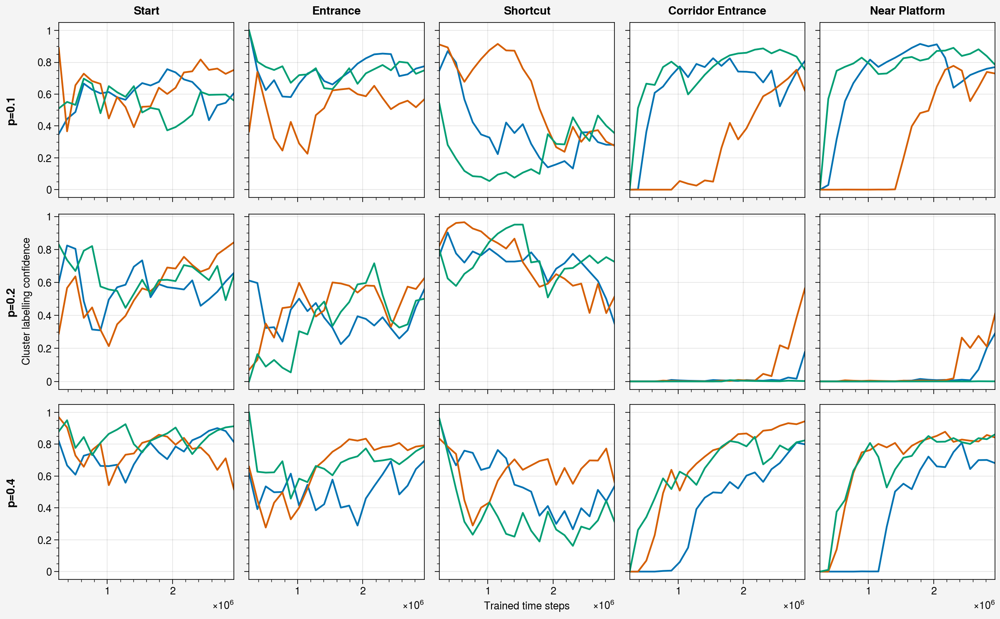

In [150]:
batch = 64
p = 0.4
trial = 0
chks = all_chks[batch]

ps = [0.1, 0.2, 0.4]
fig, ax = pplt.subplots(nrows=3, ncols=5, figwidth=12)


for i, p in enumerate(ps):
    for trial in range(3):
        key = f'{batch}_{p}_{trial}'
        res = all_cluster_res[key]
        for j in range(5):
            ax[i, j].plot(chks*batch*100, pd.Series(res['cluster_probs'][j]).ewm(alpha=0.3).mean())
    
ax.format(toplabels=cluster_labels, ylabel='Cluster labelling confidence', 
          xlabel='Trained time steps', leftlabels=[f'p={p}' for p in ps])

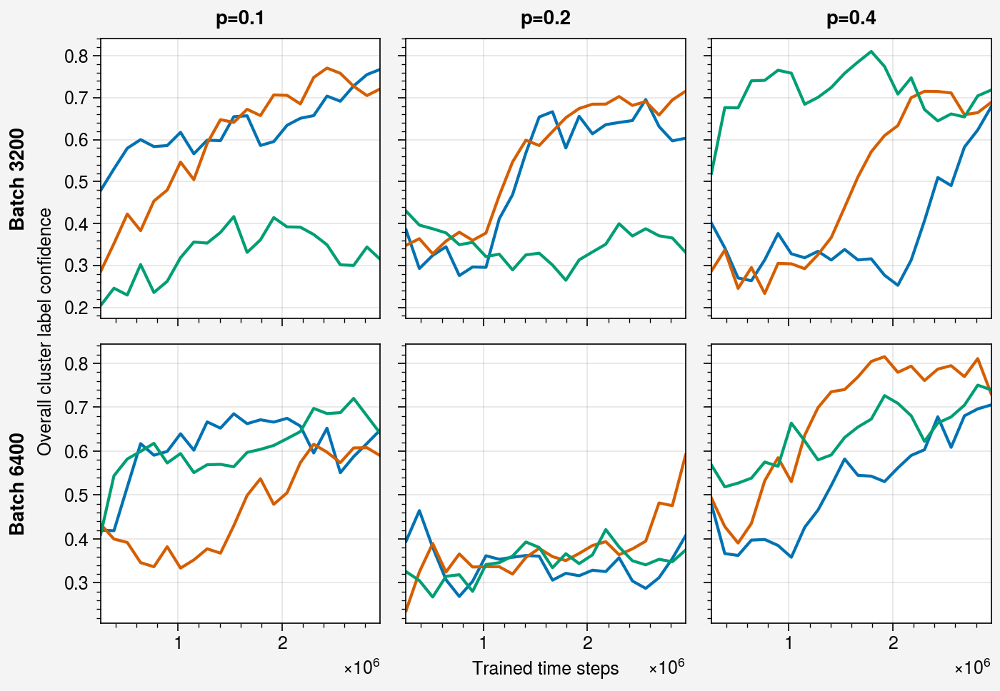

In [154]:
fig, ax = pplt.subplots(nrows=2, ncols=len(probs), figwidth=7)
for i, batch in enumerate(batch_sizes):
    chks = all_chks[batch]
    for j, prob in enumerate(probs):
        for t in range(3):
            key = f'{batch}_{prob}_{t}'
            ax[i, j].plot(np.array(chks)*batch*100, 
                          pd.Series(all_cluster_res[key]['cluster_probs'].mean(axis=0)).ewm(alpha=0.3).mean())
            
ax.format(toplabels=[f'p={p}' for p in probs], leftlabels=[f'Batch {batch*100}' for batch in batch_sizes],
          ylabel='Overall cluster label confidence', xlabel='Trained time steps')

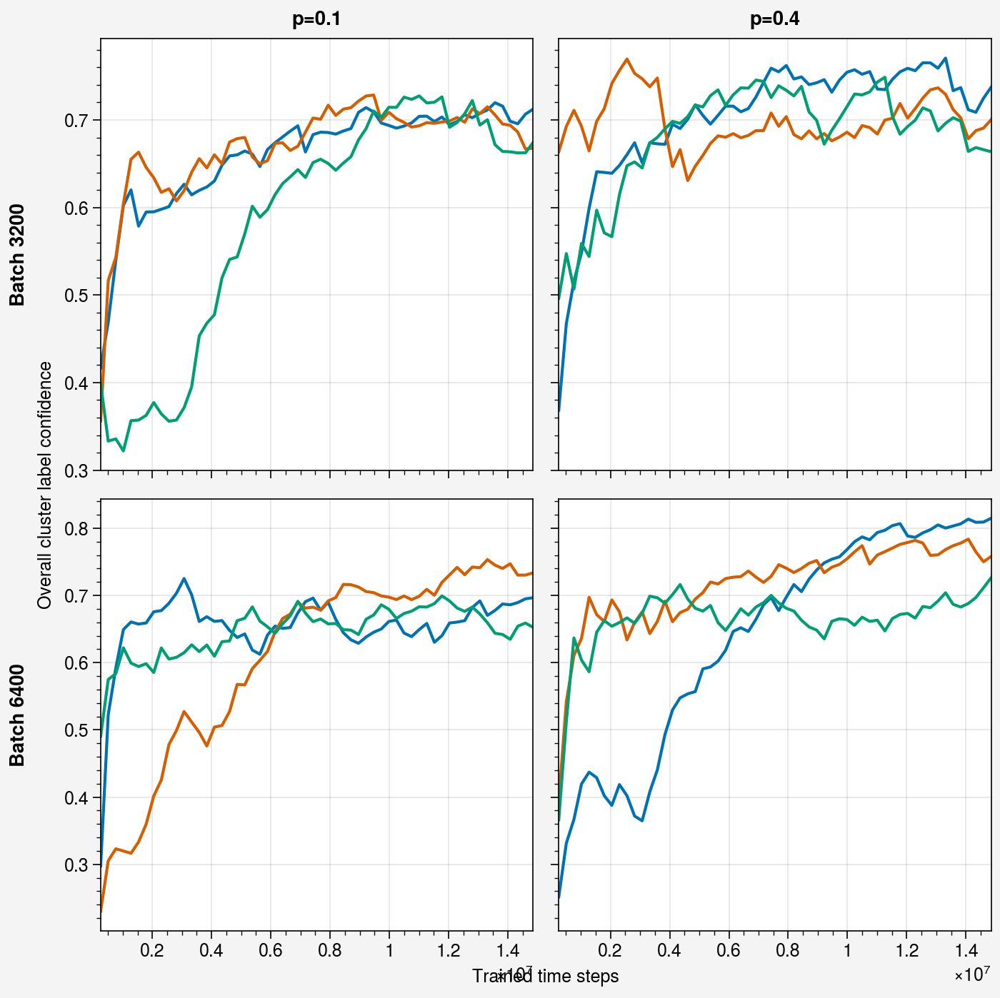

In [159]:
fig, ax = pplt.subplots(nrows=2, ncols=len(probs), figwidth=7)
for i, batch in enumerate(batch_sizes):
    chks = all_chks[batch]
    for j, prob in enumerate(probs):
        for t in range(3):
            key = f'{batch}_{prob}_{t}'
            ax[i, j].plot(np.array(chks)*batch*100, 
                          pd.Series(all_cluster_res[key]['cluster_probs'].mean(axis=0)).ewm(alpha=0.1).mean())
            
ax.format(toplabels=[f'p={p}' for p in probs], leftlabels=[f'Batch {batch*100}' for batch in batch_sizes],
          ylabel='Overall cluster label confidence', xlabel='Trained time steps')

**Examples of classification**

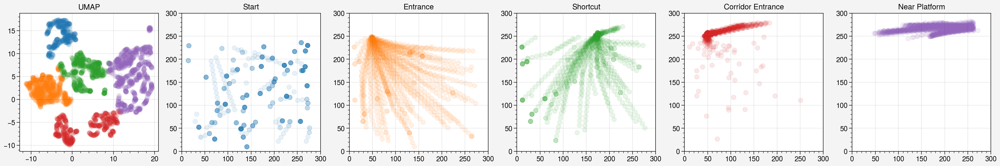

In [136]:
s = all_shortcut_res['64_0.4_0'][-1]
res = shortcut_cluster_analysis(s)
fig, ax = pplt.subplots(ncols=6, sharex=False, sharey=False)
kmeans_activ_pos_plot(s['pos'], s['activ2d'], res['labels'], ax=ax)

ax.format(title=['UMAP'] + cluster_labels)
ax[1:].format(xlim=[0, 300], ylim=[0, 300])

**Less neat examples**

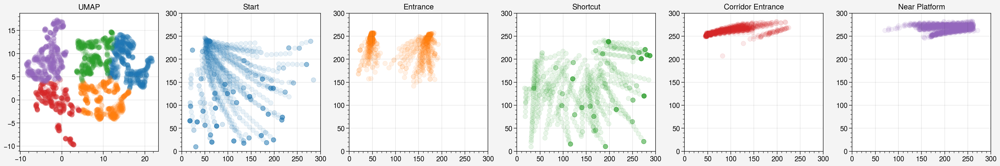

In [142]:
s = all_shortcut_res['32_0.2_1'][12]
res = shortcut_cluster_analysis(s)
fig, ax = pplt.subplots(ncols=6, sharex=False, sharey=False)
kmeans_activ_pos_plot(s['pos'], s['activ2d'], res['labels'], ax=ax)

ax.format(title=['UMAP'] + cluster_labels)
ax[1:].format(xlim=[0, 300], ylim=[0, 300])

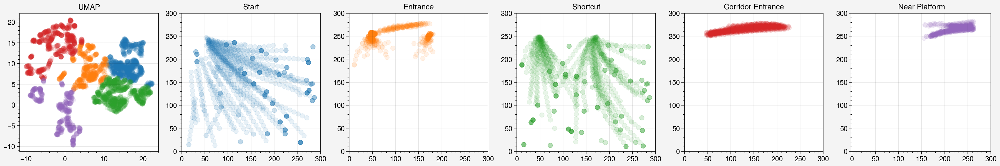

In [139]:
s = all_shortcut_res['32_0.2_0'][12]
res = shortcut_cluster_analysis(s)
fig, ax = pplt.subplots(ncols=6, sharex=False, sharey=False)
kmeans_activ_pos_plot(s['pos'], s['activ2d'], res['labels'], ax=ax)

ax.format(title=['UMAP'] + cluster_labels)
ax[1:].format(xlim=[0, 300], ylim=[0, 300])

## Shortcut use rate vs. cluster consistency

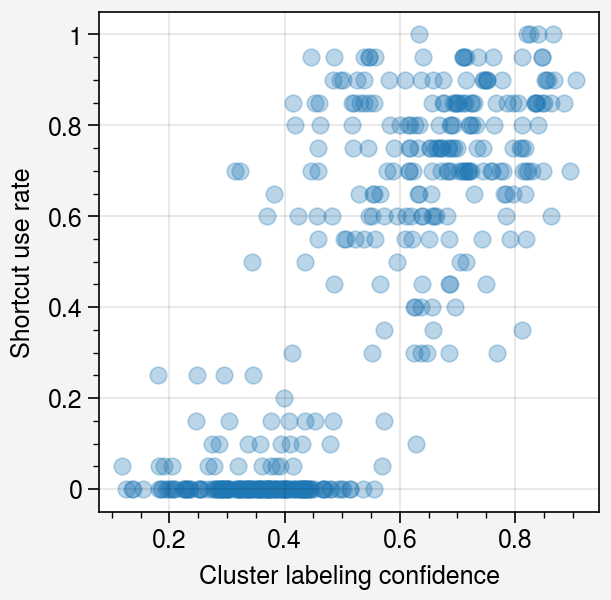

In [166]:
fig, ax = pplt.subplots()
for i, batch in enumerate(batch_sizes):
    chks = all_chks[batch]
    for j, prob in enumerate(probs):
        for t in range(3):
            key = f'{batch}_{prob}_{t}'
            c_probs = all_cluster_res[key]['cluster_probs'].mean(axis=0)
            shortcut_use_rate = [s['shortcut_use_rate'] for s in all_shortcut_res[key]]
            ax.scatter(c_probs, shortcut_use_rate, color=rgb_colors[0], alpha=0.3)
            
ax.format(xlabel='Cluster labeling confidence', ylabel='Shortcut use rate')

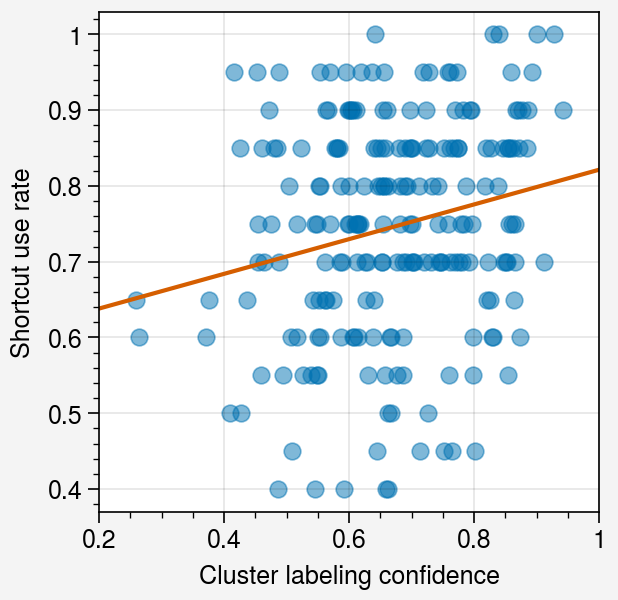

In [226]:
fig, ax = pplt.subplots()

c_probs = []
shortcut_use_rates = []
for i, batch in enumerate(batch_sizes):
    chks = all_chks[batch]
    for j, prob in enumerate(probs):
        for t in range(3):
            key = f'{batch}_{prob}_{t}'
            c_probs += list(all_cluster_res[key]['cluster_probs'].mean(axis=0))
            shortcut_use_rates += [s['shortcut_use_rate'] for s in all_shortcut_res[key]]
            
c_probs = np.array(c_probs)
shortcut_use_rates = np.array(shortcut_use_rates)

idxs = shortcut_use_rates >= 0.4
c_probs = c_probs[idxs]
shortcut_use_rates = shortcut_use_rates[idxs]

lr = LinearRegression().fit(c_probs.reshape(-1, 1), shortcut_use_rates)
y_hat = lr.predict(c_probs.reshape(-1, 1))
r2 = r2_score(shortcut_use_rates, y_hat)

ax.scatter(c_probs, shortcut_use_rates, alpha=0.5)

x = np.linspace(0.2, 1.)
ax.plot(x, lr.predict(x.reshape(-1, 1)))
ax.format(xlabel='Cluster labeling confidence', ylabel='Shortcut use rate')

In [221]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score


In [207]:
idxs = (shortcut_use_rates < 0.1) & (c_probs > 0.4)

[[1.         0.94318182 0.05681818 0.         0.        ]
 [0.         0.79452055 0.20547945 0.         0.        ]
 [0.         0.47682119 0.52317881 0.         0.        ]
 [0.         0.92366412 0.07633588 0.         0.        ]
 [0.         0.67261905 0.32738095 0.         0.        ]]


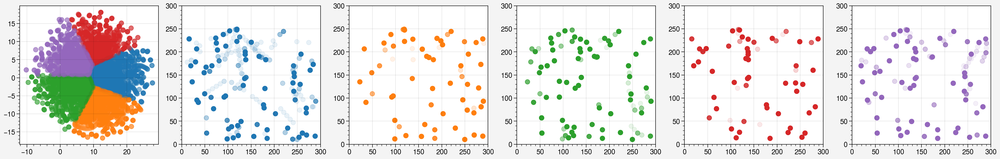

In [212]:
# key = '64_0.2_2'
# key = '64_0.4_0'
key = '32_0.1_2'
res = all_cluster_res[key]
shortcut_res = all_shortcut_res[key]

i = 3

s = shortcut_res[i]
res = shortcut_cluster_analysis(s)
# labels = res['labels'][i]
labels = res['labels']

kmeans_activ_pos_plot(s['pos'], s['activ2d'], labels=labels)
print(res['reordered_cluster_probs'])

In [210]:
for i, batch in enumerate(batch_sizes):
    chks = all_chks[batch]
    for j, prob in enumerate(probs):
        for t in range(3):
            key = f'{batch}_{prob}_{t}'
            print(key)

32_0.1_0
32_0.1_1
32_0.1_2
32_0.2_0
32_0.2_1
32_0.2_2
32_0.4_0
32_0.4_1
32_0.4_2
64_0.1_0
64_0.1_1
64_0.1_2
64_0.2_0
64_0.2_1
64_0.2_2
64_0.4_0
64_0.4_1
64_0.4_2


# Transition probs and cluster distances

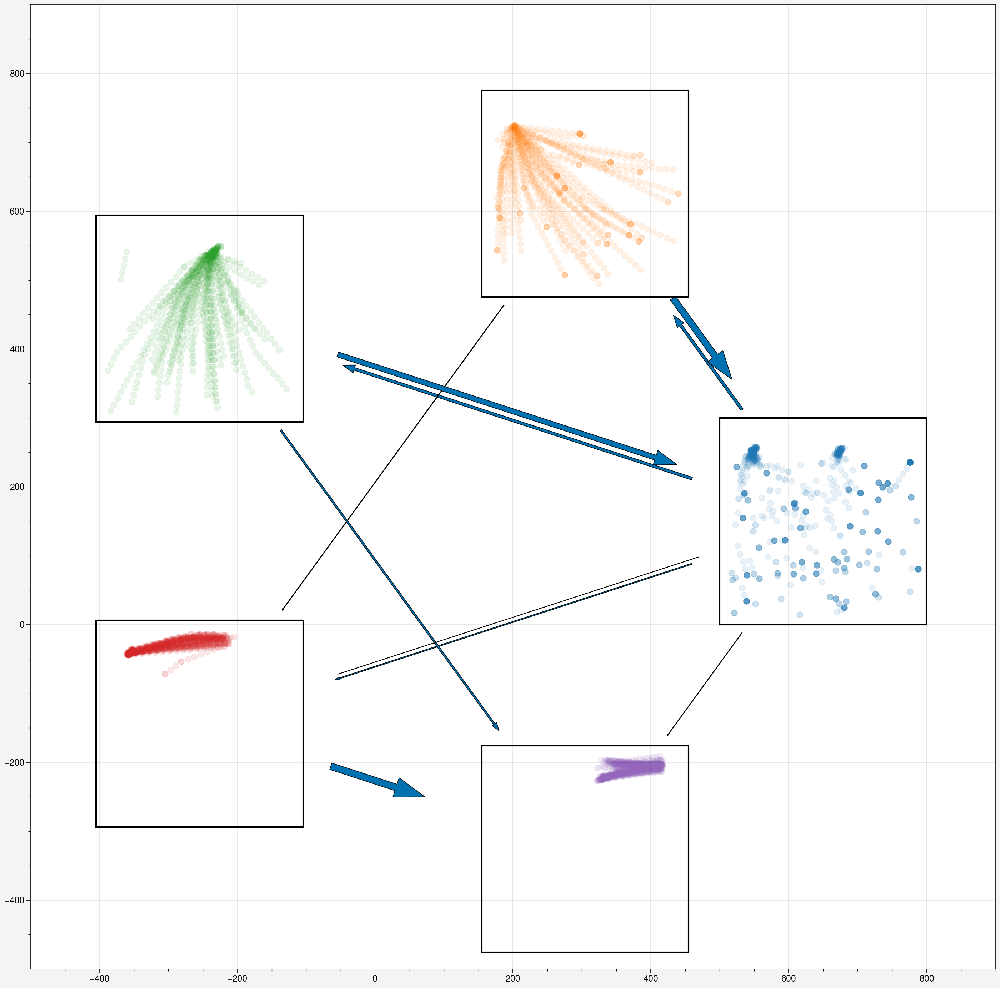

In [240]:
key = '64_0.4_1'
shortcut_res = all_shortcut_res[key]
s = shortcut_res[20]

res = shortcut_cluster_analysis(s)

labels = res['labels']
pos = s['pos']
activ2d = res['activ2d']
t = res['t_prob'].copy()

fig, ax = pplt.subplots(figwidth=14)

for i in range(5):
    t[i, i] = 0.

n_clusters = 5
angle_offsets = np.linspace(0, 2*np.pi, n_clusters, endpoint=False)
position_offsets = [np.cos(angle_offsets)*500, np.sin(angle_offsets)*500]

box = np.array([
    [0, 0],
    [0, 300],
    [300, 300],
    [300, 0],
    [0, 0]
], dtype='float')
box_centers = np.array(position_offsets).T+150

for i in range(n_clusters):
    for j in range(n_clusters):
        if i == j or t[i, j] < 0.01:
            continue
        center1 = box_centers[i]
        center2 = box_centers[j]
        x, y = center1[0], center1[1]
        dx, dy = center2[0]-center1[0], center2[1]-center1[1]
        arrow_angle = np.arctan2(dy, dx)
        x += np.cos(arrow_angle)*200
        y += np.sin(arrow_angle)*200
        dx -= np.cos(arrow_angle)*(400+t[i,j]*90)
        dy -= np.sin(arrow_angle)*(400+t[i,j]*90)
        if i > j:
            x += 10
            y += 10
        ax.arrow(x, y, dx, dy, width=t[i, j]*10)

pos = s['pos']
for i in range(n_clusters):
    p = pos[labels == i]
    b = box.copy()
    p[:, 0] += position_offsets[0][i]
    p[:, 1] += position_offsets[1][i]
    b[:, 0] += position_offsets[0][i]
    b[:, 1] += position_offsets[1][i]
    ax.scatter(p.T[0], p.T[1], color=rgb_colors[i], alpha=0.1)
    ax.plot(b.T[0], b.T[1], color='black')

# ax.scatter(position_offsets[0], position_offsets[1])
ax.format(xlim=[-500, 900], ylim=[-500, 900])

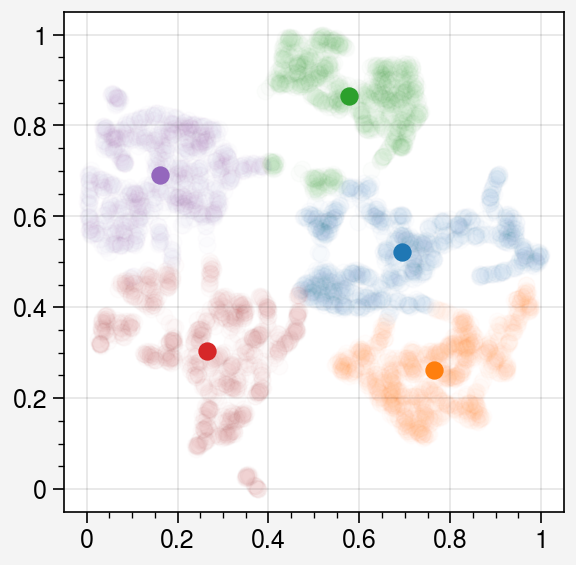

In [241]:
fig, ax = pplt.subplots()
c = res['cluster_centers']

for i in range(5):
    idxs = labels == i
    ax.scatter(activ2d[idxs].T[0], activ2d[idxs].T[1], alpha=0.01, color=rgb_colors[i])
    ax.scatter([c.T[0][i]], [c.T[1][i]], color=rgb_colors[i])


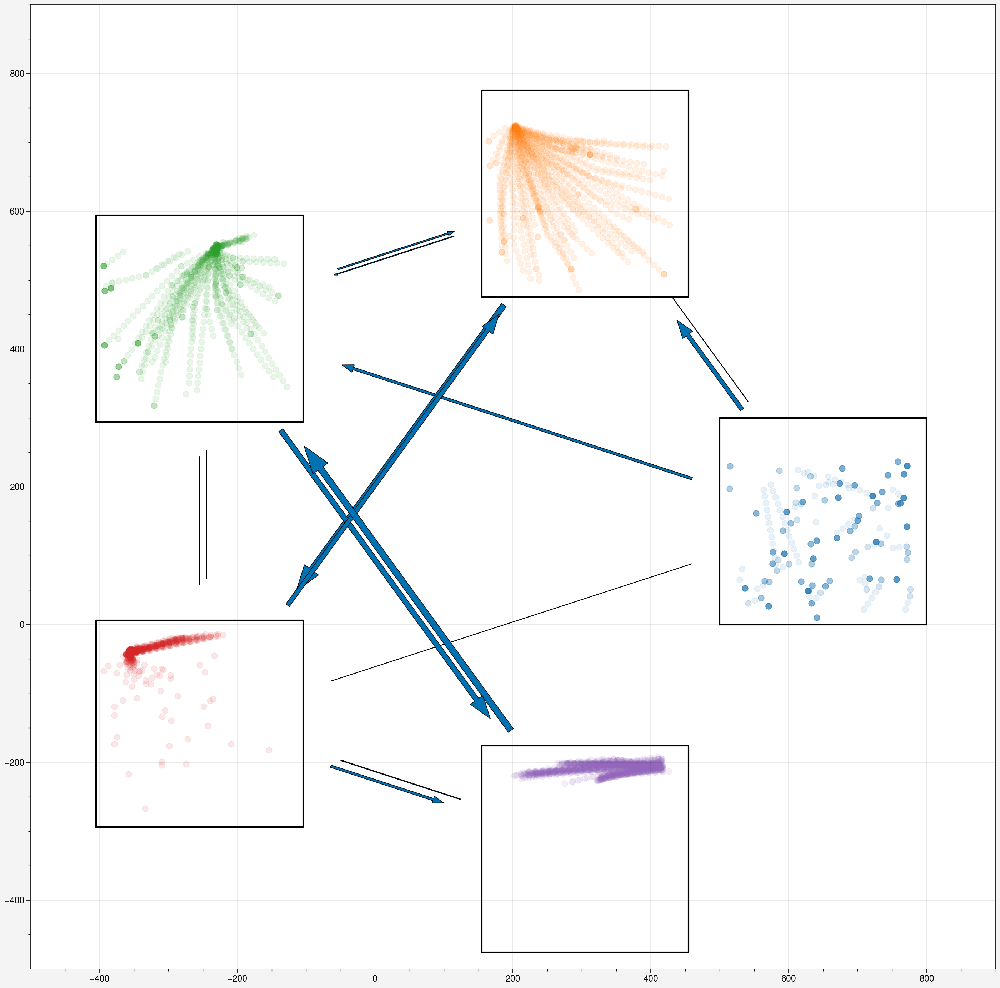

In [259]:
key = '64_0.4_0'
shortcut_res = all_shortcut_res[key]
s = shortcut_res[-1]

res = shortcut_cluster_analysis(s)

labels = res['labels']
pos = s['pos']
activ2d = res['activ2d']
t = res['t_prob'].copy()

fig, ax = pplt.subplots(figwidth=14)

for i in range(5):
    t[i, i] = 0.

n_clusters = 5
angle_offsets = np.linspace(0, 2*np.pi, n_clusters, endpoint=False)
position_offsets = [np.cos(angle_offsets)*500, np.sin(angle_offsets)*500]

box = np.array([
    [0, 0],
    [0, 300],
    [300, 300],
    [300, 0],
    [0, 0]
], dtype='float')
box_centers = np.array(position_offsets).T+150

for i in range(n_clusters):
    for j in range(n_clusters):
        if i == j or t[i, j] < 0.01:
            continue
        center1 = box_centers[i]
        center2 = box_centers[j]
        x, y = center1[0], center1[1]
        dx, dy = center2[0]-center1[0], center2[1]-center1[1]
        arrow_angle = np.arctan2(dy, dx)
        x += np.cos(arrow_angle)*200
        y += np.sin(arrow_angle)*200
        dx -= np.cos(arrow_angle)*(400+t[i,j]*90)
        dy -= np.sin(arrow_angle)*(400+t[i,j]*90)
        if i > j:
            x += 10
            y += 10
        ax.arrow(x, y, dx, dy, width=t[i, j]*10)

pos = s['pos']
for i in range(n_clusters):
    p = pos[labels == i]
    b = box.copy()
    p[:, 0] += position_offsets[0][i]
    p[:, 1] += position_offsets[1][i]
    b[:, 0] += position_offsets[0][i]
    b[:, 1] += position_offsets[1][i]
    ax.scatter(p.T[0], p.T[1], color=rgb_colors[i], alpha=0.1)
    ax.plot(b.T[0], b.T[1], color='black')

# ax.scatter(position_offsets[0], position_offsets[1])
ax.format(xlim=[-500, 900], ylim=[-500, 900])

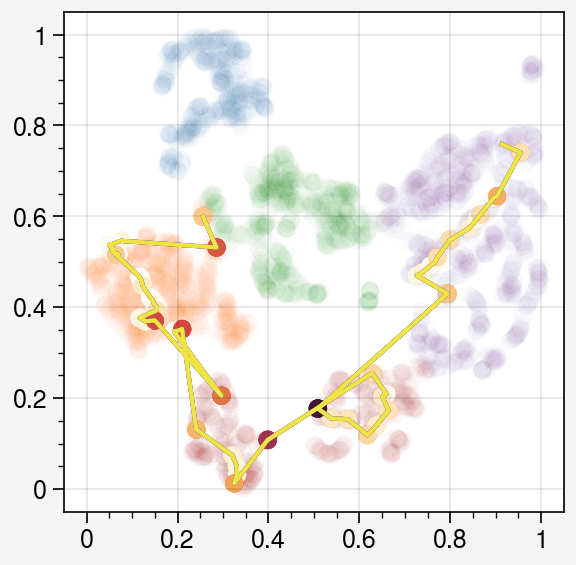

In [276]:
ep = 0
a = res['ep_activ2d'][ep]
activ_dists = np.sqrt(np.sum((a[:-1] - a[1:])**2, axis=1))

fig, ax = pplt.subplots()
for i in range(5):
    idxs = labels == i
    ax.scatter(activ2d[idxs].T[0], activ2d[idxs].T[1], alpha=0.01, color=rgb_colors[i])

    ax.plot(a.T[0], a.T[1])
    # ax.scatter(a.T[0], a.T[1], c=np.arange(len(a)))
    ax.scatter(a.T[0, :-1], a.T[1, :-1], c=activ_dists)

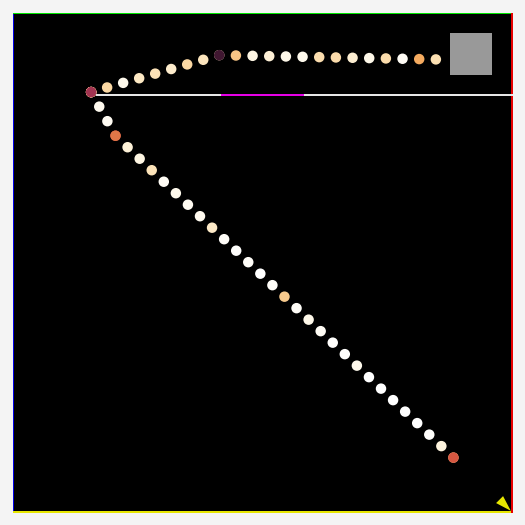

In [275]:
ep_activ2d = res['ep_activ2d']

set_trajectory_plot_style()
fig, ax = pplt.subplots()

env = gym.make('ShortcutNav-v0', fixed_reset=[np.array([299., 1.]), -np.pi/4])
set_trajectory_plot_style()
env.reset()
env.render(ax=ax)

a = ep_activ2d[ep]
p = s['ep_pos'][ep]
activ_dists = np.sqrt(np.sum((a[:-1] - a[1:])**2, axis=1))
ax.scatter(p[1:].T[0], p[1:].T[1], c=activ_dists, alpha=1, s=10)
    
ax.format(xlim=[0, 300], ylim=[0, 300])

pplt.rc.reset()

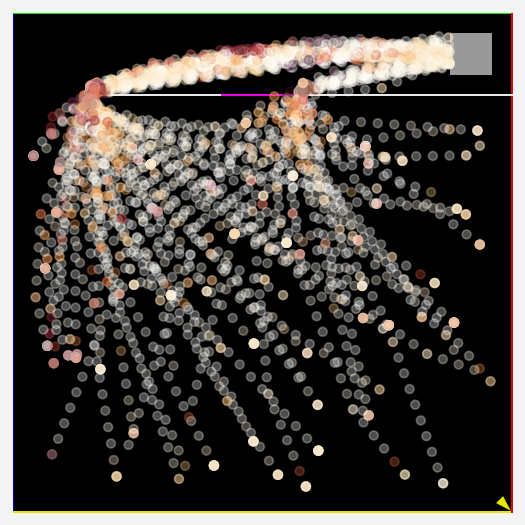

In [84]:
ep_activ2d = res['ep_activ2d']

set_trajectory_plot_style()
fig, ax = pplt.subplots()

env = gym.make('ShortcutNav-v0', fixed_reset=[np.array([299., 1.]), -np.pi/4])
set_trajectory_plot_style()
env.reset()
env.render(ax=ax)

for i in range(len(ep_activ2d)):
    a = ep_activ2d[i]
    p = s['ep_pos'][i]
    activ_dists = np.sqrt(np.sum((a[:-1] - a[1:])**2, axis=1))
    ax.scatter(p[1:].T[0], p[1:].T[1], c=activ_dists, alpha=0.3, s=10)
    
ax.format(xlim=[0, 300], ylim=[0, 300])

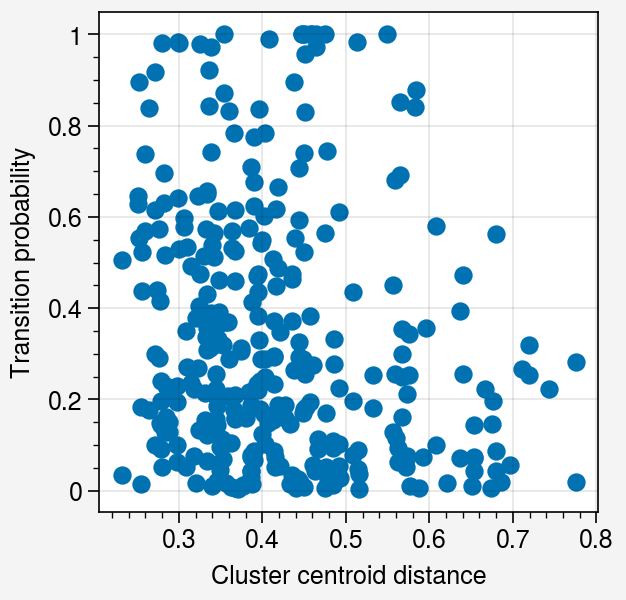

In [93]:
t_probs = []
cluster_dists = []

cluster_res = all_cluster_res[key]

pplt.rc.reset()
fig, ax = pplt.subplots()

for i in range(len(cluster_res['cluster_centers'])):
    cluster_dist = pairwise_distances(cluster_res['cluster_centers'][i])
    t_prob = cluster_res['t_prob'][i]
    for i, j in itertools.product(range(n_clusters), range(n_clusters)):
        if t_prob[i, j] != 0:
            t_probs.append(t_prob[i, j])
            cluster_dists.append(cluster_dist[i, j])
            
ax.scatter(cluster_dists, t_probs)
ax.format(xlabel='Cluster centroid distance', ylabel='Transition probability')

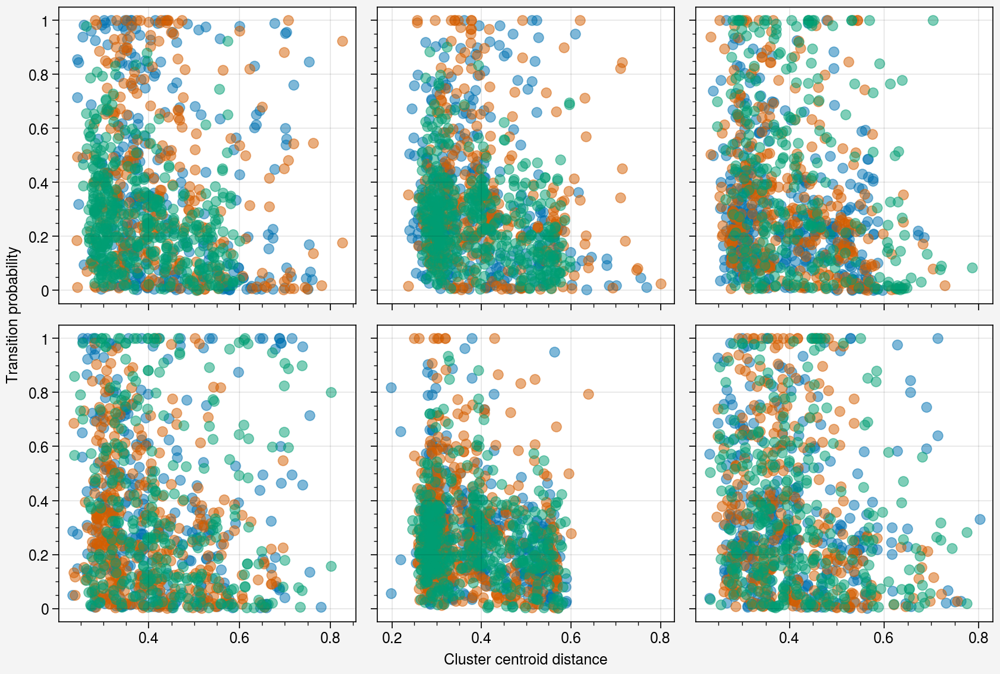

In [96]:

pplt.rc.reset()
fig, ax = pplt.subplots(nrows=2, ncols=3)


for i, batch in enumerate(batch_sizes):
    for j, prob in enumerate(probs):
        for t in range(3):
            key = f'{batch}_{prob}_{t}'
            cluster_res = all_cluster_res[key]
            
            t_probs = []
            cluster_dists = []
            
            for n in range(len(cluster_res['cluster_centers'])):
                cluster_dist = pairwise_distances(cluster_res['cluster_centers'][n])
                t_prob = cluster_res['t_prob'][n]
                for x, y in itertools.product(range(n_clusters), range(n_clusters)):
                    if t_prob[x, y] != 0:
                        t_probs.append(t_prob[x, y])
                        cluster_dists.append(cluster_dist[x, y])
            
            ax[i, j].scatter(cluster_dists, t_probs, alpha=0.5)
ax.format(xlabel='Cluster centroid distance', ylabel='Transition probability')

R2: 0.04102362998632447


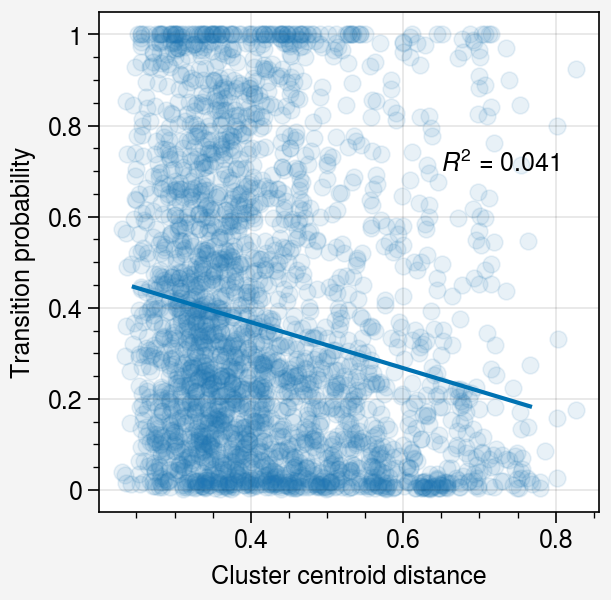

In [257]:

pplt.rc.reset()
fig, ax = pplt.subplots()


for i, batch in enumerate(batch_sizes):
    for j, prob in enumerate(probs):
        for t in range(3):
            key = f'{batch}_{prob}_{t}'
            cluster_res = all_cluster_res[key]
            
            t_probs = []
            cluster_dists = []
            
            # Skip "poor" clusters
            cluster_probs = cluster_res['cluster_probs'].mean(axis=0)
            
            for n in range(len(cluster_res['cluster_centers'])):
                if cluster_probs[n] < 0.5:
                    continue
                cluster_dist = pairwise_distances(cluster_res['cluster_centers'][n])
                t_prob = cluster_res['t_prob'][n]
                for x, y in itertools.product(range(n_clusters), range(n_clusters)):
                    if t_prob[x, y] != 0:
                        t_probs.append(t_prob[x, y])
                        cluster_dists.append(cluster_dist[x, y])
            
            ax.scatter(cluster_dists, t_probs, alpha=0.1, color=rgb_colors[0])
            
            
x, y, r = linear_bestfit(cluster_dists, t_probs)
ax.plot(x, y)
print(f'R2: {r}')
ax.text(0.65, 0.7, f'$R^2$ = {r:.3f}')
ax.format(xlabel='Cluster centroid distance', ylabel='Transition probability')

# Consistency of UMAP separation

In [278]:
prob = 0.4
trial = 0
batch = 64
res = test_shortcut_activations(prob=prob, trial=trial, batch=batch, skip_activs=False)

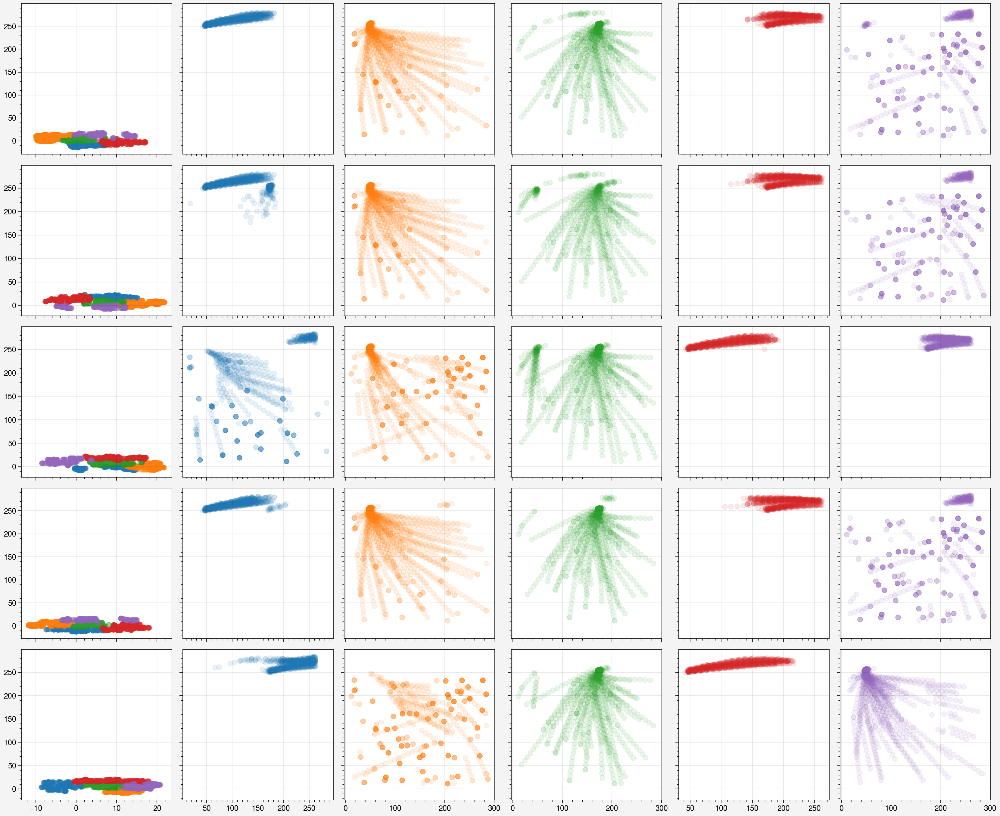

In [294]:
fig, ax = pplt.subplots(nrows=5, ncols=6, sharex=False, sharey=False)

for i in range(5):
    activ = res['activs']['shared_activations'][1]

    umap = UMAP(min_dist=0.5)
    activ2d = umap.fit_transform(activ)
    res['activ2d'] = activ2d
    pos = res['pos']

    cluster_res = shortcut_cluster_analysis(res)

    labels = cluster_res['labels']
    activ2d = res['activ2d']
    
    kmeans_activ_pos_plot(pos, activ2d, labels=labels, ax=ax[i, :])
    
ax[:, 1:].format(xlim=[0, 300], ylim=[0, 300])

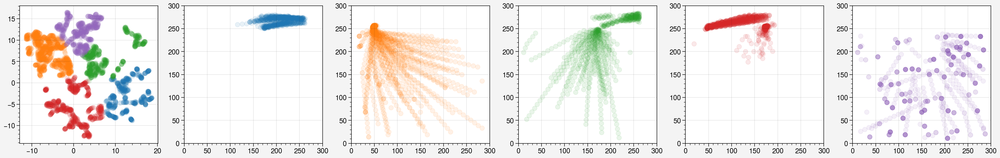

In [295]:
activ = res['activs']['shared_activations'][1]

umap = UMAP(min_dist=0.5)
activ2d = umap.fit_transform(activ)
res['activ2d'] = activ2d
pos = res['pos']

cluster_res = shortcut_cluster_analysis(res)

labels = cluster_res['labels']
activ2d = res['activ2d']

kmeans_activ_pos_plot(pos, activ2d, labels=labels)

In [ ]:
activs = res['activs']

In [298]:
activ = torch.hstack([a['shared_activations'] for a in activs])[1]

NameError: name 'activs' is not defined

In [297]:
cluster_res['reordered_cluster_probs']

array([[0.17      , 0.        , 0.        , 0.11020408, 0.88979592],
       [0.24      , 0.84480122, 0.        , 0.14107901, 0.01411977],
       [0.13      , 0.00856996, 0.66845706, 0.15799489, 0.16497809],
       [0.24      , 0.06294756, 0.05035805, 0.82217401, 0.06452038],
       [0.22      , 0.        , 0.        , 0.        , 0.        ]])

In [300]:
s = res
pos = s['pos']
ep_lens = get_ep_lens(s['ep_pos'])
km = KMeans(n_clusters=n_clusters)
labels = km.fit_predict(activ2d)
ep_labels = ep_split_res(labels, ep_lens)

In [302]:
for i in range(5):
    print(np.sum([e[0] == i for e in ep_labels]))

0
0
1
24
75


In [299]:
cluster_res['labels']

dict_keys(['cluster_probs', 'relabel_map', 'cluster_names', 'no_remap_conflict', 'reordered_cluster_probs', 'reordered_transition_probs', 'labels', 'cluster_centers', 't_prob', 'km', 'ep_activ2d', 'activ2d'])

# Representation of distance to platform

In [ ]:
ep = 0
a = res['ep_activ2d'][ep]
activ_dists = np.sqrt(np.sum((a[:-1] - a[1:])**2, axis=1))

key = '64_0.4_0'
shortcut_res = all_shortcut_res[key]
s = shortcut_res[-1]

res = shortcut_cluster_analysis(s)

fig, ax = pplt.subplots()
for i in range(5):
    idxs = labels == i
    ax.scatter(activ2d[idxs].T[0], activ2d[idxs].T[1], alpha=0.01, color=rgb_colors[i])

    ax.plot(a.T[0], a.T[1])
    # ax.scatter(a.T[0], a.T[1], c=np.arange(len(a)))
    ax.scatter(a.T[0, :-1], a.T[1, :-1], c=activ_dists)v

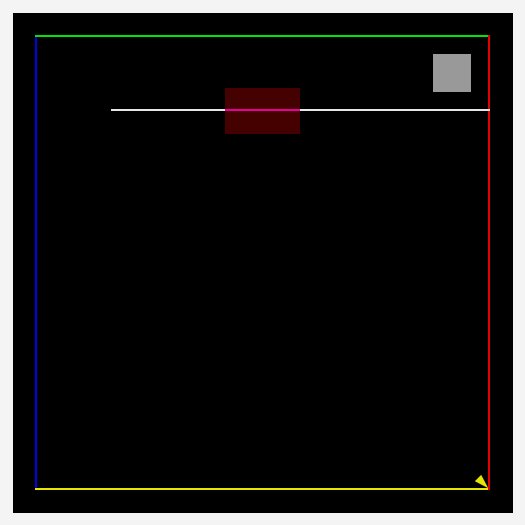

In [168]:
env = gym.make('ShortcutNav-v0', fixed_reset=[np.array([299., 1.]), -np.pi/4])
set_trajectory_plot_style()
fig, ax = pplt.subplots()
env.reset()
env.render(ax=ax)

rect = plt.Rectangle([125, 235], 50, 30, fc=[0.9, 0., 0., 0.3])
ax.add_patch(rect)

In [161]:
start_cluster

array([96.,  0.,  2.,  0.,  2.])

In [131]:
box - 150

array([[-150., -150.],
       [-150.,  150.],
       [ 150.,  150.],
       [ 150., -150.],
       [-150., -150.]])

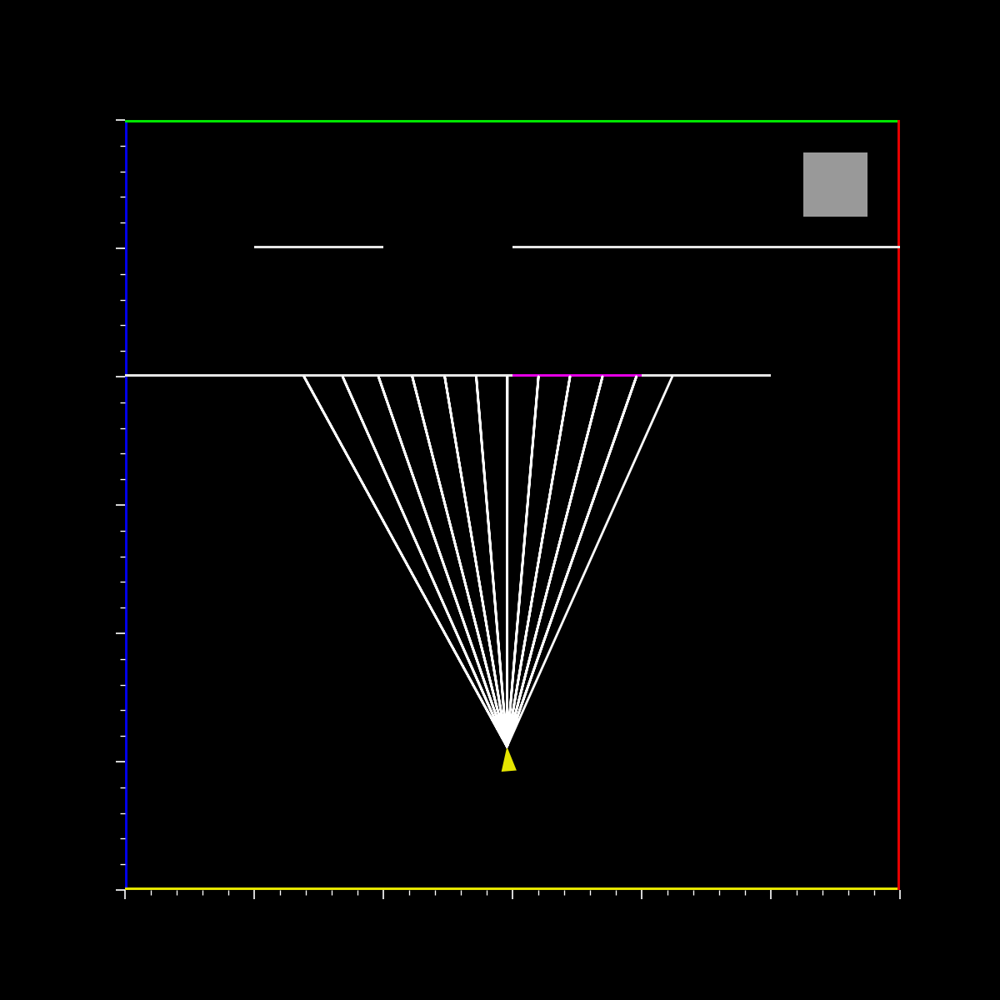

In [62]:
env = gym.make('ShortcutNav-v0', shortcut_config=2.5, wall_colors=4, shortcut_probability=0.8)
env.reset()
env.render('human')

(array([1.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 1.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 1.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 1.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 1.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       1.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 1.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 1.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 1.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 1.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       1.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 1.        , 0.        , 0.        ,
       0.        , 0.        , 0.09375494, 0.09132333, 0.0896

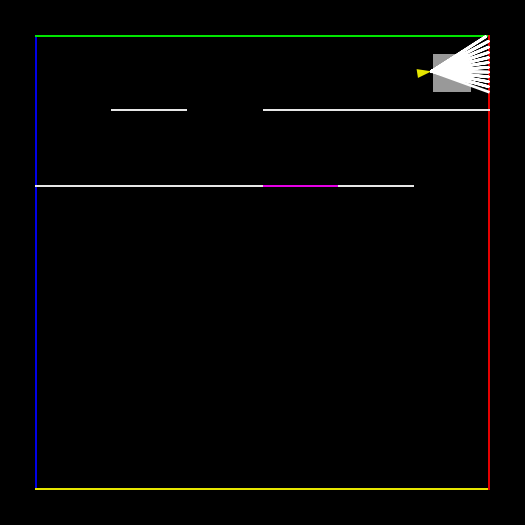

In [169]:
fig, ax = pplt.subplots()
print(env.step(1))
env.render(ax=ax)

In [63]:
env.boxes[-2].corner

array([150, 200])